# Interprétabilité des modèles

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
%matplotlib inline
import seaborn as sns
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from sklearn.metrics import roc_curve

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPClassifier, MLPRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error

# Chargement des données

In [6]:
data = pd.read_csv("../data/data.csv",sep=",",header=0)
data = data.drop('Unnamed: 0', axis = 1)
data.head()

,group,brand,city,parking,pool,children_policy,price,stock,date,language,mobile
0,Independant,Independant,valletta,0,0,0,109,37,38,austrian,0
1,Independant,Independant,valletta,0,0,0,109,37,38,austrian,0
2,Independant,Independant,valletta,0,0,0,109,37,38,austrian,0
3,Accar Hotels,Ibas,rome,0,0,0,75,0,1,belgian,1
4,Accar Hotels,Ibas,rome,0,0,0,78,0,1,belgian,1


In [7]:
dict_city = data.groupby("city")["price"].mean().to_dict()
dict_language = data.groupby("language")["price"].mean().to_dict()
dict_brand = data.groupby("brand")["price"].mean().to_dict()
dict_group = data.groupby("group")["price"].mean().to_dict()

In [8]:
!pip install category_encoders > /dev/null 2>&1

In [9]:
from category_encoders import TargetEncoder

In [10]:
encoder = TargetEncoder()
data['city'] = encoder.fit_transform(data['city'],data['price'])
data['language'] = encoder.fit_transform(data['language'],data['price'])
data['brand'] = encoder.fit_transform(data['brand'],data['price'])
data['group'] = encoder.fit_transform(data['group'],data['price'])

/home/dussere/.local/lib/python3.9/site-packages/category_encoders/target_encoder.py:122: FutureWarning: Default parameter min_samples_leaf will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327
  warnings.warn("Default parameter min_samples_leaf will change in version 2.6."
/home/dussere/.local/lib/python3.9/site-packages/category_encoders/target_encoder.py:127: FutureWarning: Default parameter smoothing will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327
  warnings.warn("Default parameter smoothing will change in version 2.6."


In [11]:
data

,group,brand,city,parking,pool,children_policy,price,stock,date,language,mobile
0,97.280827,97.280827,157.728818,0,0,0,109,37,38,199.149733,0
1,97.280827,97.280827,157.728818,0,0,0,109,37,38,199.149733,0
2,97.280827,97.280827,157.728818,0,0,0,109,37,38,199.149733,0
3,181.567726,80.435527,184.535354,0,0,0,75,0,1,169.092780,1
4,181.567726,80.435527,184.535354,0,0,0,78,0,1,169.092780,1
...,...,...,...,...,...,...,...,...,...,...,...
54352,97.280827,97.280827,146.620416,0,0,0,90,39,38,155.756094,0
54353,97.280827,97.280827,146.620416,0,0,0,92,34,36,169.092780,0
54354,97.280827,97.280827,146.620416,0,0,0,92,34,36,181.391163,0
54355,250.537269,349.512708,183.599887,1,1,0,413,5,5,155.756094,0


# Création de l'échantillon d'apprentissage et de l'échantillon test

In [12]:
price=data["price"]
X_train,X_test,price_train,price_test=train_test_split(data,price,test_size=0.25,random_state=11)
X_train=X_train.drop(['price'], axis=1)
X_test=X_test.drop(['price'], axis=1)
X_train.head()

,group,brand,city,parking,pool,children_policy,stock,date,language,mobile
19450,181.567726,80.435527,120.036696,0,0,0,19,19,147.192711,0
27595,97.280827,97.280827,203.251847,0,0,0,8,16,155.756094,0
20397,138.332094,146.154354,183.599887,0,0,0,75,35,155.756094,0
33272,157.271389,232.046218,230.740555,0,1,0,1,1,216.787397,1
10297,181.567726,80.435527,146.620416,1,0,0,6,18,159.109453,1


## Interprétabilité des Random Forests

In [13]:
rf= RandomForestRegressor(n_estimators=500,max_features=2)
rfFit=rf.fit(X_train, price_train)

## Interprétabilité

### Features Importance

In [14]:
# Importance décroissante des variables
feature_importance_df = pd.DataFrame({
    'Feature' : X_train.columns,
    'Importance' : rfFit.feature_importances_
}).sort_values(by='Importance', ascending=False)
feature_importance_df

,Feature,Importance
1,brand,0.486310
2,city,0.104530
0,group,0.100982
7,date,0.100393
6,stock,0.092007
4,pool,0.073619
8,language,0.022194
5,children_policy,0.009309
3,parking,0.008539
9,mobile,0.002117


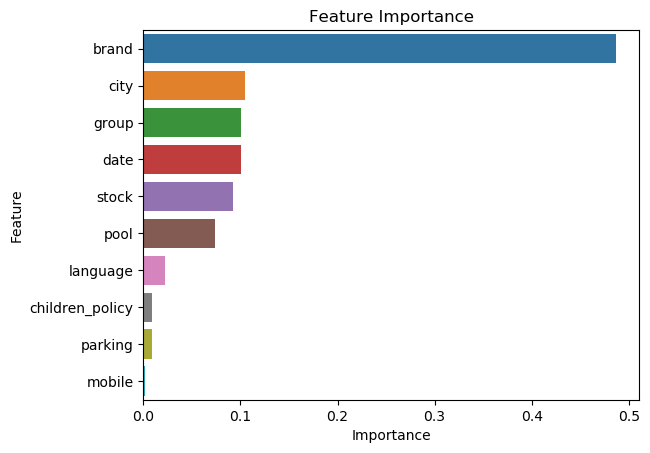

In [15]:
plt.title('Feature Importance')
sns.barplot(data = feature_importance_df.head(20), x='Importance', y='Feature')

<font color = 'blue'> Nous remarquons que le modèle donne une très grande importance à la variable brand. Cela rappelle l'analyse descriptive que nous avions faites précédemment où on avait déjà remarqué que selon la marque le prix des hôtels variait grandement.

### PDP and ICE plots

In [16]:
!pip install pdpbox > /dev/null 2>&1
!pip install lime> /dev/null 2>&1

brand


findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


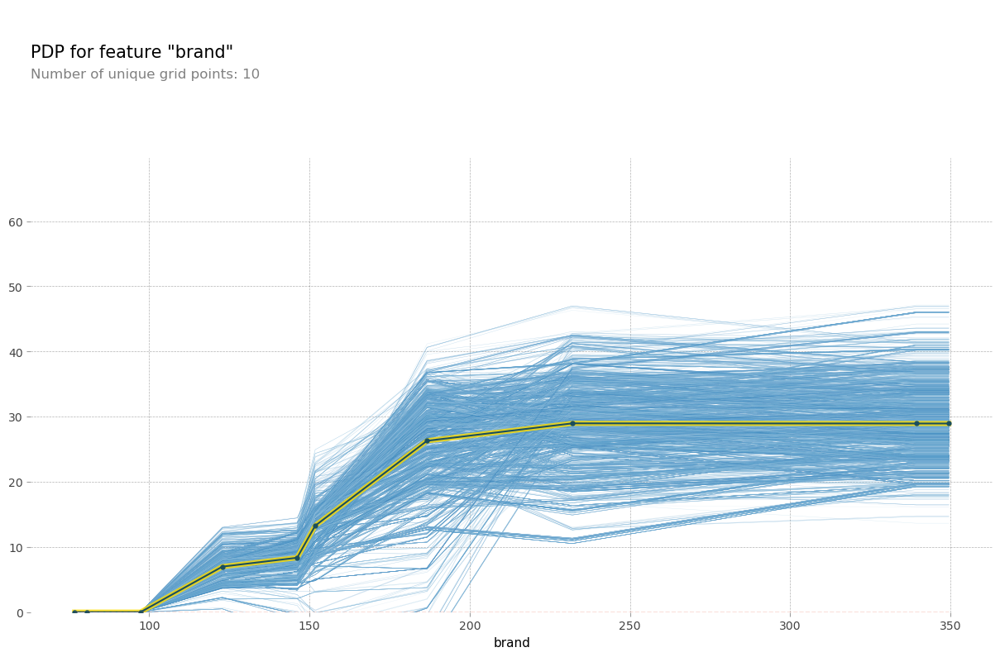

city


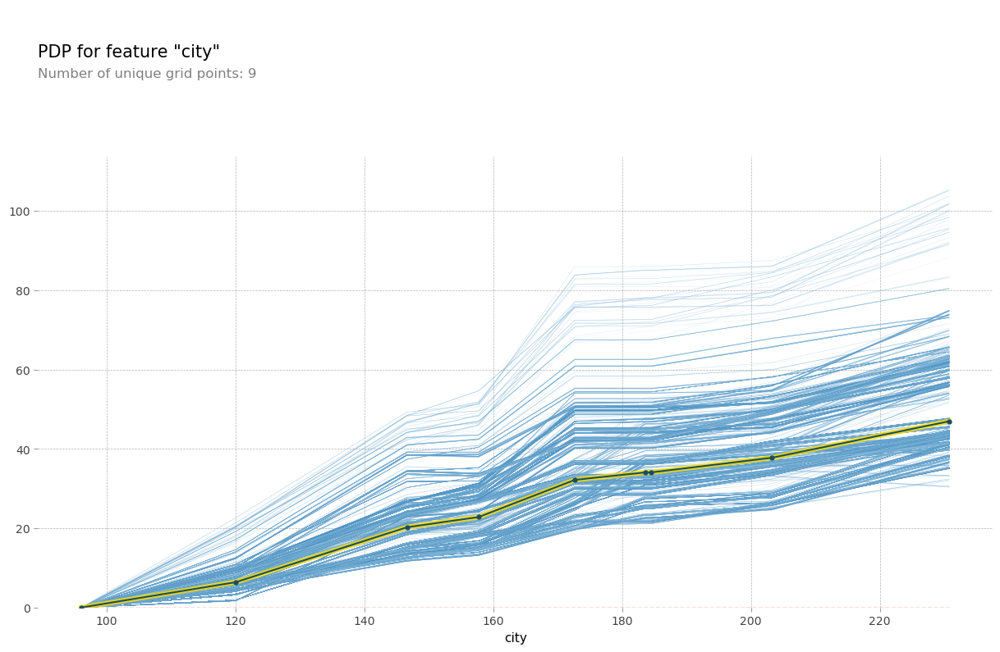

group


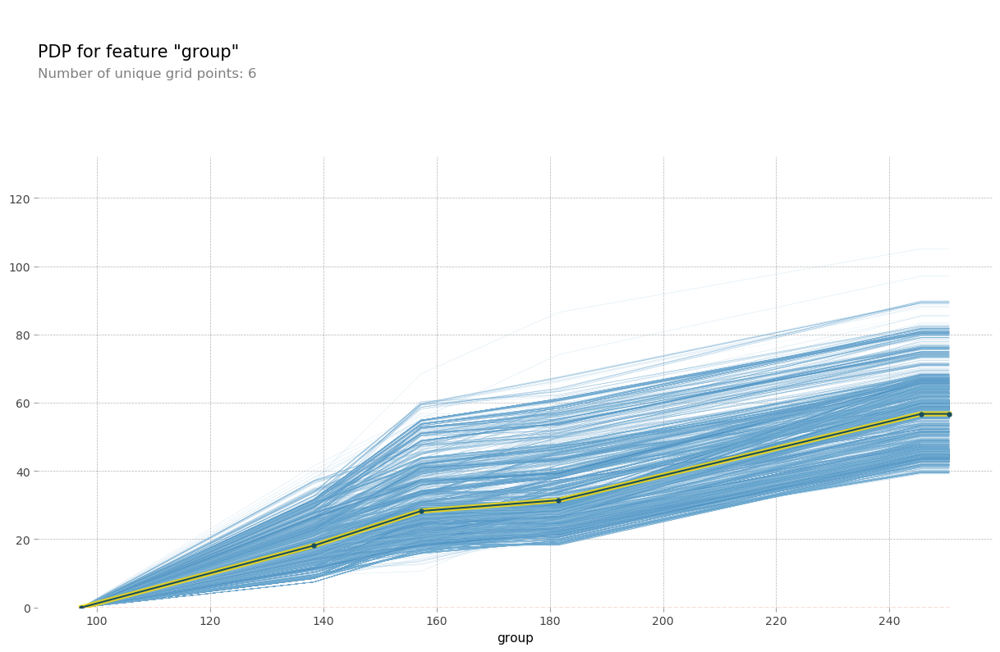

date


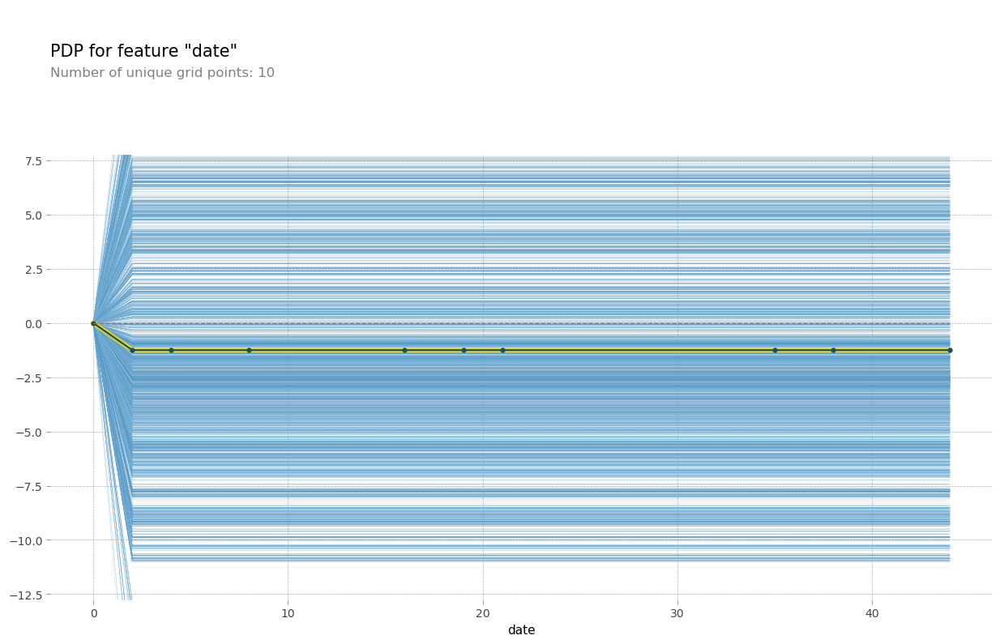

stock


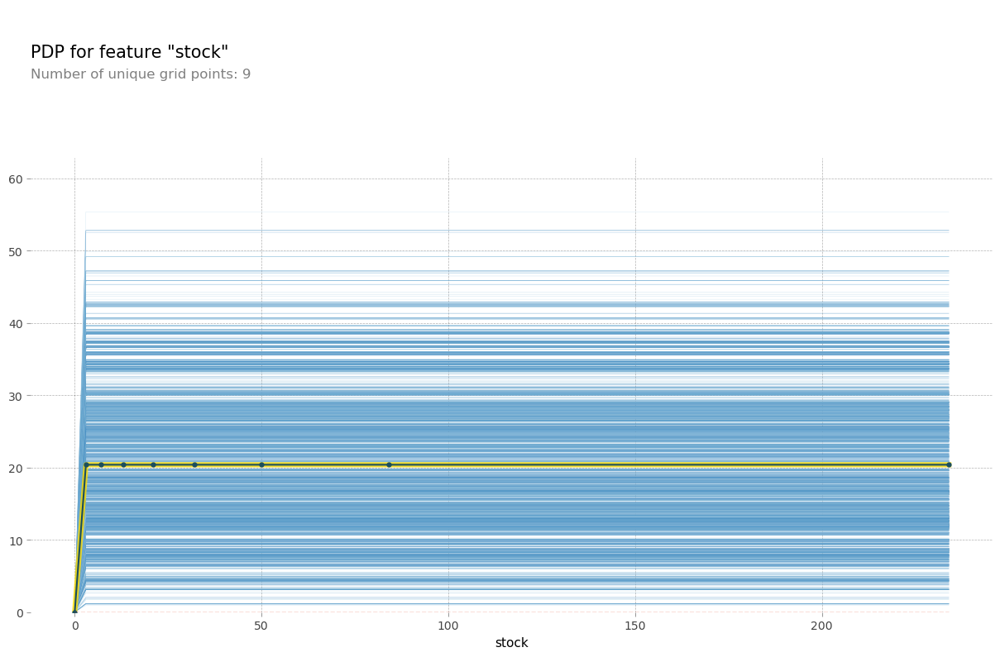

In [17]:
from pdpbox import pdp, get_dataset, info_plots
model = rf
model_name = 'random forest'

features_importance_dict = {}
features_importance_dict[model_name] = feature_importance_df #add the dataframe to your dictionnary

top_5_features = features_importance_dict[model_name].Feature[:5].values

for i, feature in enumerate(top_5_features, 1):
    print(feature)
    pdp_feat = pdp.pdp_isolate(model=model, dataset=X_test, model_features=features_importance_dict[model_name].Feature.values, feature=feature)
    pdp.pdp_plot(pdp_feat, feature, plot_lines=True, frac_to_plot=0.5)
    plt.show()

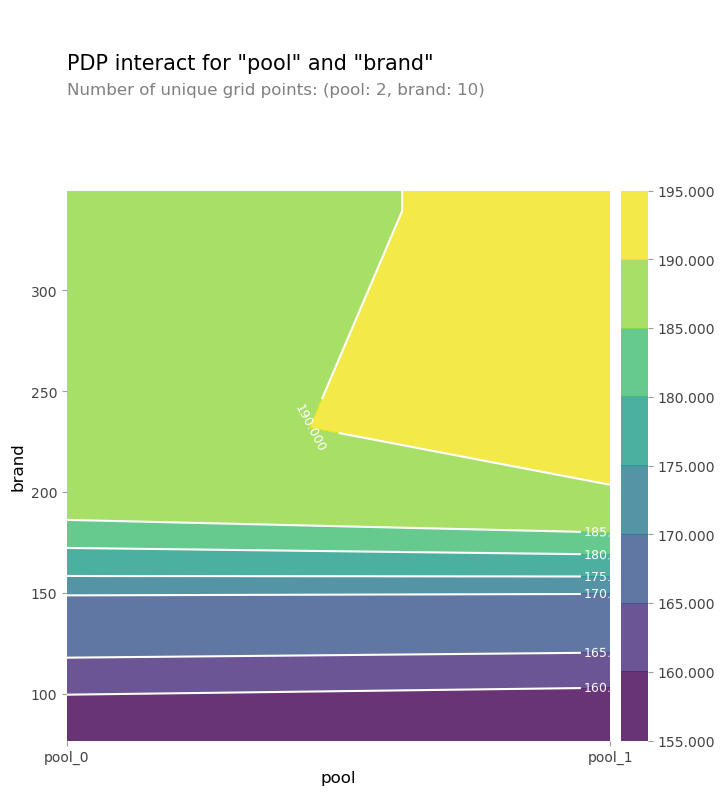

In [18]:
features_to_plot = ['pool', 'brand']
inter1 = pdp.pdp_interact(model=model, dataset=X_test, model_features=features_importance_dict[model_name].Feature, features=features_to_plot)

pdp.pdp_interact_plot(pdp_interact_out=inter1, feature_names=features_to_plot, plot_type='contour')
plt.show()

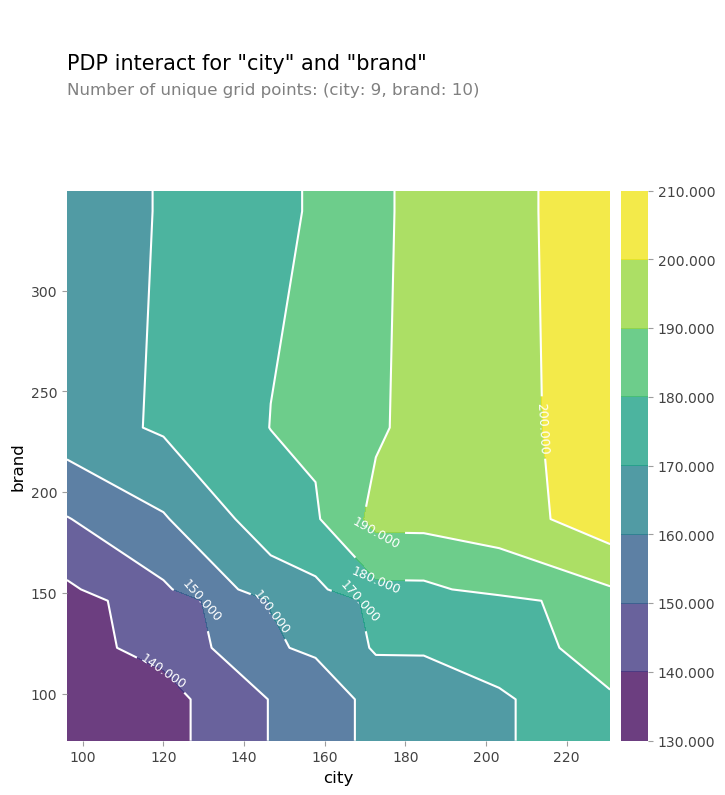

In [19]:
features_to_plot = ['city', 'brand']
inter1 = pdp.pdp_interact(model=model, dataset=X_test, model_features=features_importance_dict[model_name].Feature, features=features_to_plot)

pdp.pdp_interact_plot(pdp_interact_out=inter1, feature_names=features_to_plot, plot_type='contour')
plt.show()

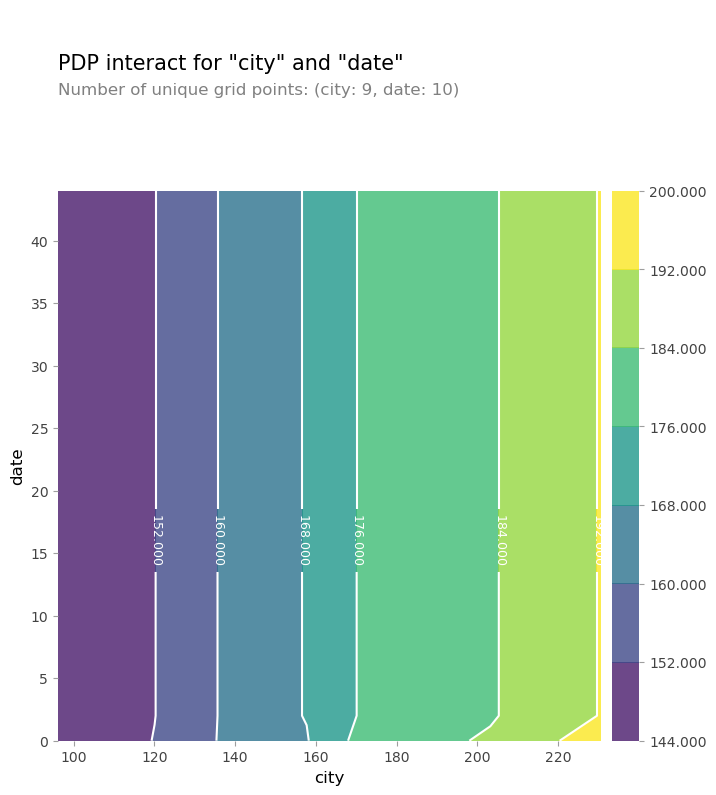

In [20]:
features_to_plot = ['city', 'date']
inter1 = pdp.pdp_interact(model=model, dataset=X_test, model_features=features_importance_dict[model_name].Feature, features=features_to_plot)

pdp.pdp_interact_plot(pdp_interact_out=inter1, feature_names=features_to_plot, plot_type='contour')
plt.show()

<font color = 'blue'>   

### LIME

In [21]:
import lime
import lime.lime_tabular

index = 0

explainer = lime.lime_tabular.LimeTabularExplainer(X_test.values, feature_names=features_importance_dict[model_name].Feature, mode="regression")
exp = explainer.explain_instance(X_test.iloc[index], rf.predict, num_features=5, top_labels=1)
exp.show_in_notebook(show_table=True, show_all=True)

<font color = 'blue'>  On voit que la valeur prédite est de 143.78. Concernant cette prédiction on a la variable city qui a un effet positif alors que pool, order_requests,pool et language. Ici on a une analyse locale qui concerne la premiere ligne de notre jeu de données

## Shap

In [22]:
import shap
shap.initjs()
idx = 1 
explainer = shap.KernelExplainer(rf.predict, X_test.iloc[0:30])
shap_values = explainer.shap_values(X_test.iloc[0:30])

  0%|          | 0/30 [00:00<?, ?it/s]

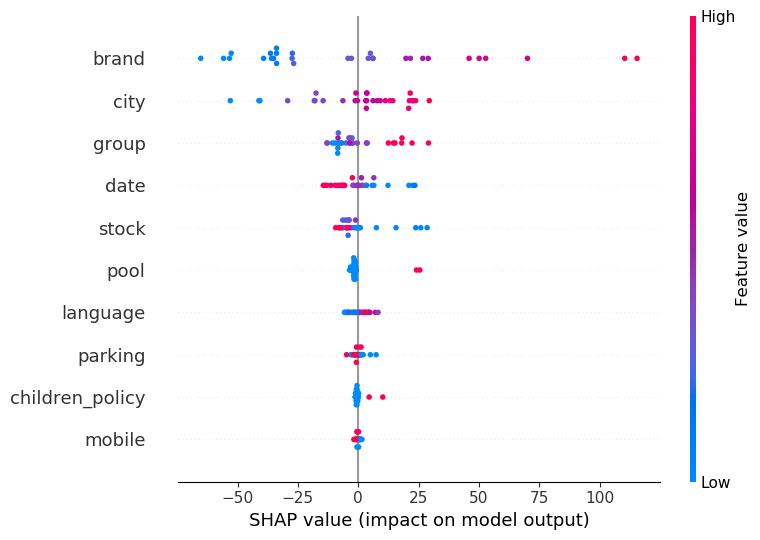

In [23]:
shap.summary_plot(shap_values, X_test.iloc[0:30])

<font color = 'blue'> Nous remarquons que le modèle donne le plus d'importance à la variable brand, ce qui cohérent avec nos résultats précedents.  On voit que plus la valeur de brand est "élevée", plus le prix le sera également. Ensuite nous avons city,gropu et date. On voit que le fait d'avoir une piscine ou une policy pour enfants fait augmenter le prix.
    
    

# Boosting target

In [28]:
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import GradientBoostingClassifier, GradientBoostingRegressor

boosting = GradientBoostingRegressor()
boosting.fit(X_train, price_train)
print(f"Boosting score: {boosting.score(X_test, price_test):.2f}")

Boosting score: 0.95


## Feature Importance


In [29]:
# Importance décroissante des variables
feature_importance_df = pd.DataFrame({
    'Feature' : X_train.columns,
    'Importance' : boosting.feature_importances_
}).sort_values(by='Importance', ascending=False)
feature_importance_df

,Feature,Importance
1,brand,0.806807
6,stock,0.089674
2,city,0.089074
7,date,0.007967
8,language,0.003009
4,pool,0.001195
0,group,0.001028
3,parking,0.000978
5,children_policy,0.000267
9,mobile,0.000000


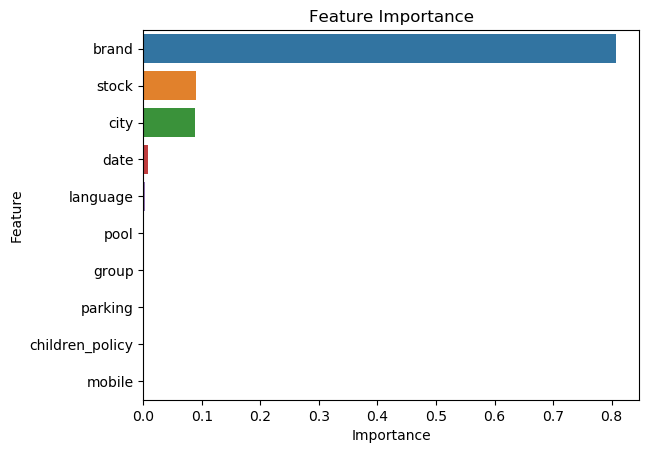

In [30]:
plt.title('Feature Importance')
sns.barplot(data = feature_importance_df.head(10), x='Importance', y='Feature')

<font color = 'blue'> Nous voyons que brand est maintenant à 80% suivie de city, stock et date. Les autres sont tres faibles avec des valeurs autours de 0.01 %. Sachant que c'est le modèle qui marche le mieux sur os données, on peut supposer que le fait qu'il partage cette importance parmis ces 4 variables, permet de mieux prédire le prix.

## PDP plots

brand


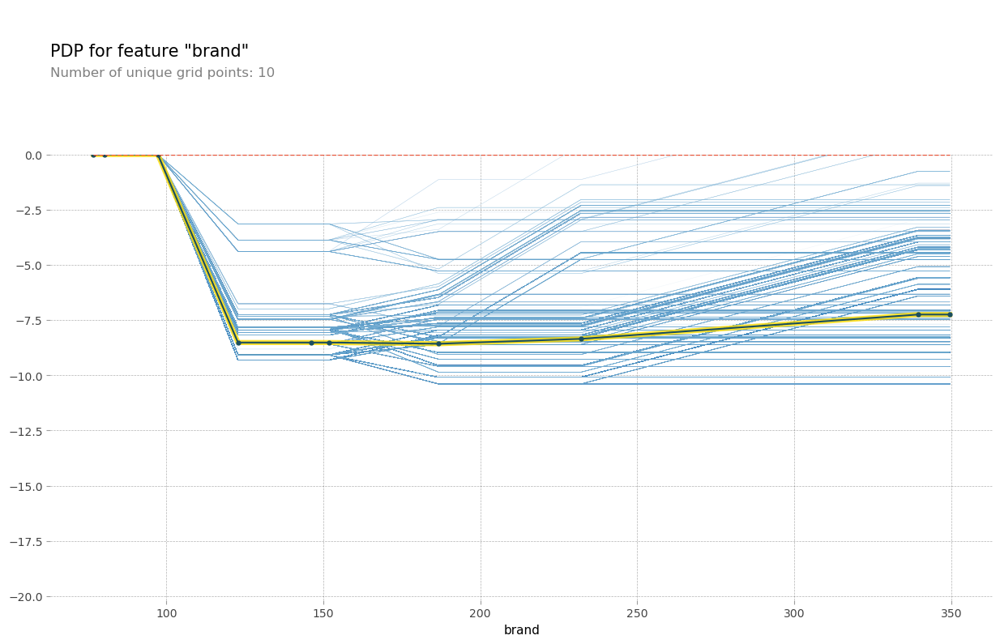

stock


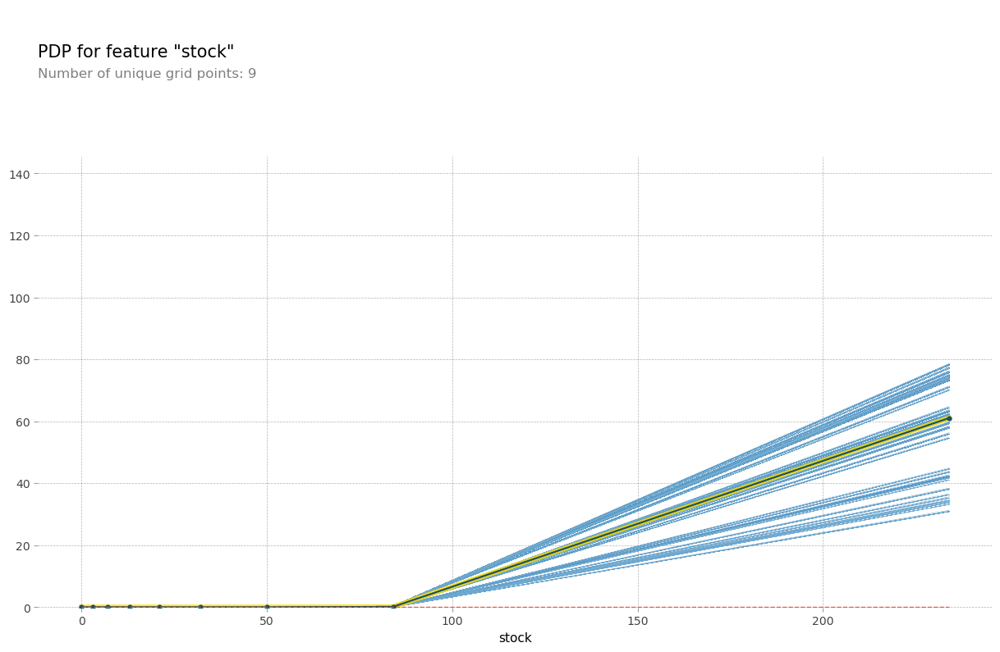

city


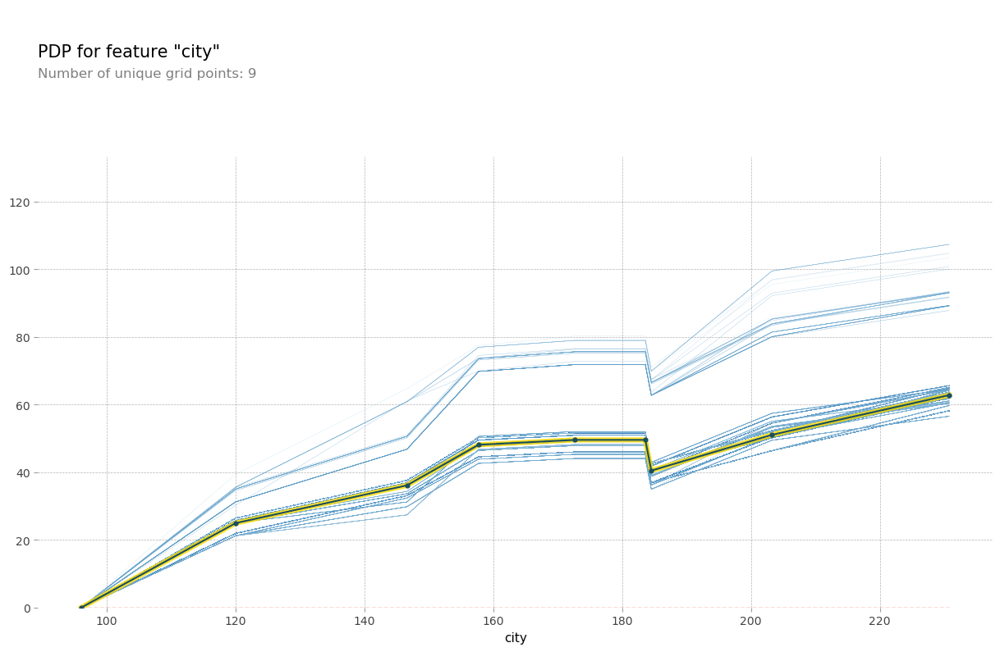

date


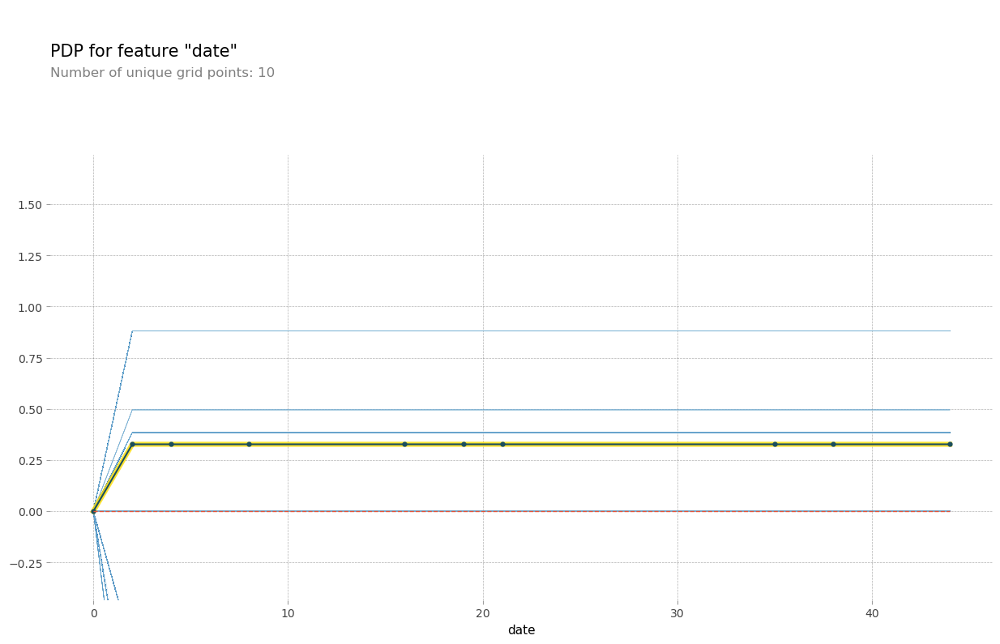

language


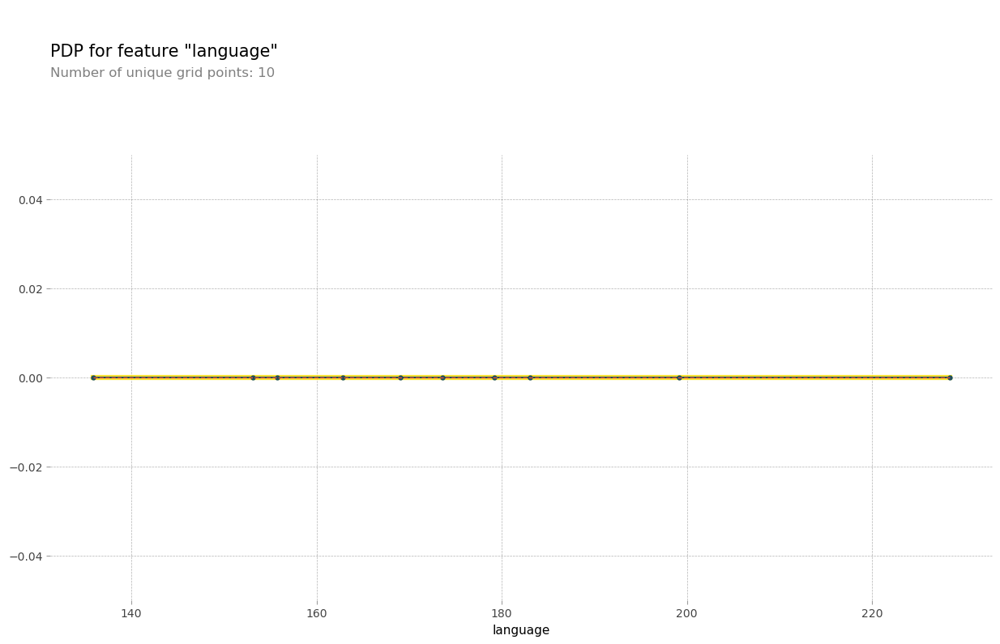

In [31]:
from pdpbox import pdp, get_dataset, info_plots
model = boosting
model_name = 'boosting'

features_importance_dict = {}
features_importance_dict[model_name] = feature_importance_df #add the dataframe to your dictionnary

top_5_features = features_importance_dict[model_name].Feature[:5].values

for i, feature in enumerate(top_5_features, 1):
    print(feature)
    pdp_feat = pdp.pdp_isolate(model=model, dataset=X_test, model_features=features_importance_dict[model_name].Feature.values, feature=feature)
    pdp.pdp_plot(pdp_feat, feature, plot_lines=True, frac_to_plot=0.5)
    plt.show()

## Lime


In [32]:
import lime
import lime.lime_tabular

index = 0

explainer = lime.lime_tabular.LimeTabularExplainer(X_test.values, feature_names=features_importance_dict[model_name].Feature, mode="regression")
exp = explainer.explain_instance(X_test.iloc[index], boosting.predict, num_features=5, top_labels=1)
exp.show_in_notebook(show_table=True, show_all=True)

<font color = 'blue'>  Pour la même que precedemment nous n'avons pas du tout les mêmes résultats. La prédiction est de 214.93 et les variables stock, date, order_requests et mobile ont un effet positif sur notre réponse.


## Shap

In [33]:
import shap
shap.initjs()
idx = 1 
explainer = shap.KernelExplainer(boosting.predict, X_test.iloc[0:30])
shap_values = explainer.shap_values(X_test.iloc[0:30])

  0%|          | 0/30 [00:00<?, ?it/s]

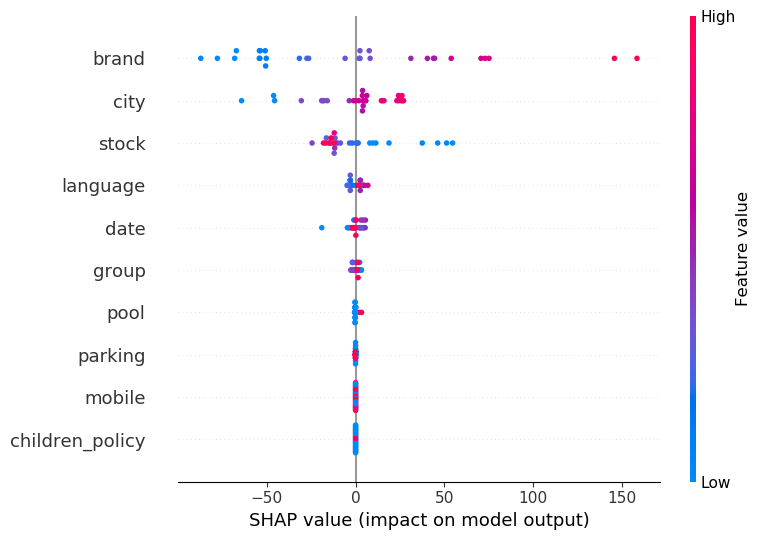

In [34]:
shap.summary_plot(shap_values, X_test.iloc[0:30])

<font color = 'blue'> Nous remarquons brand est la variable ou l'impact est le plus varié, dépendant de la brand en question. Nous pourrons les distinguer avec le one encoding. On remarque que moins on a de stock, le plus le prix augmente.
    

# Random Forest One hot encoding 

In [38]:
data = pd.read_csv('data.csv')
#data = data.drop(columns = 'hotel_id')
#data = data.drop(columns = 'avatar_name')
data = data.drop(columns = 'Unnamed: 0')
data_r = pd.get_dummies(data, columns = ['group', 'city', 'brand', 'language']) #on catégorise les variables qualitatives par le one-hot encoder.
data_r.head()

,parking,pool,children_policy,price,stock,date,mobile,group_Accar Hotels,group_Boss Western,group_Chillton Worldwide,...,language_lithuanian,language_luxembourgish,language_maltese,language_polish,language_portuguese,language_romanian,language_slovakian,language_slovene,language_spanish,language_swedish
0,0,0,0,109,37,38,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,109,37,38,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,109,37,38,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,75,0,1,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,78,0,1,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0


In [39]:
#Séparation du jeu de données en jeu d'apprentissage et de test
price = data_r["price"]
price = np.log(price)
X_train, X_test, price_train, price_test = train_test_split(data_r,price,test_size=0.25,random_state=11)
X_train = X_train.drop(['price'],axis=1)
X_test = X_test.drop(['price'],axis=1)
X_train.shape, price_train.shape

((40767, 64), (40767,))

In [40]:
rf= RandomForestRegressor(n_estimators=400,max_features=2)
rfFit=rf.fit(X_train, price_train)

In [41]:
predictions = rf.predict(X_test)

## Feature importance

In [42]:
# Importance décroissante des variables
feature_importance_df = pd.DataFrame({
    'Feature' : X_train.columns,
    'Importance' : rfFit.feature_importances_
}).sort_values(by='Importance', ascending=False)
feature_importance_df

,Feature,Importance
4,date,0.087708
3,stock,0.087165
21,brand_8 Premium,0.076758
35,brand_Safitel,0.076436
1,pool,0.066960
...,...,...
52,language_italian,0.000660
51,language_irish,0.000611
54,language_lithuanian,0.000591
48,language_german,0.000566


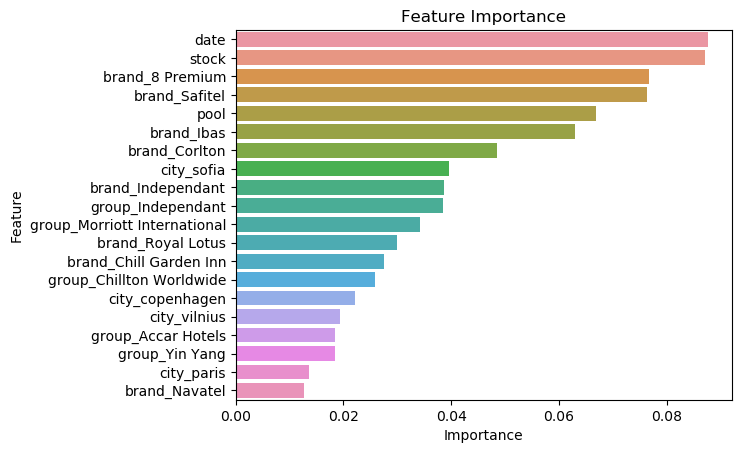

In [43]:
plt.title('Feature Importance')
sns.barplot(data = feature_importance_df.head(20), x='Importance', y='Feature')

<font color = 'blue'> Ici nous avons les variables codées dans toutes leus catégories. Nous voyons que la variable la plus important est la brand Safitel. Ensuite la date, le stock , la brand 8 premium et encore la piscine. Nous décidons de regrouper toutes les variables pour plus de lisibilité.

In [44]:
importance = feature_importance_df.head(20)
importance['is_brand'] = importance.Feature.str.contains('brand')
brand_importance = importance[importance['is_brand'] == True]
sum_brand_importance = brand_importance['Importance'].sum()

importance = feature_importance_df.head(20)
importance['is_city'] = importance.Feature.str.contains('city')
city_importance = importance[importance['is_city'] == True]
sum_city_importance = city_importance['Importance'].sum()

importance = feature_importance_df.head(20)
importance['is_language'] = importance.Feature.str.contains('language')
language_importance = importance[importance['is_language'] == True]
sum_language_importance = language_importance['Importance'].sum()

importance = feature_importance_df.head(20)
importance['is_group'] = importance.Feature.str.contains('group')
group_importance = importance[importance['is_group'] == True]
sum_group_importance = group_importance['Importance'].sum()

importance = feature_importance_df.head(20)
df = pd.DataFrame(columns=['Feature','Importance'])
df.loc[len(importance.axes[0])] = ['brand', sum_brand_importance]
df.loc[len(importance.axes[0])+1] = ['city', sum_city_importance]
df.loc[len(importance.axes[0])+2] = ['language', sum_language_importance]
df.loc[len(importance.axes[0])+4] = ['group', sum_group_importance]

importance1 = importance[importance['Feature'] == 'pool']
importance2 = importance[importance['Feature'] == 'parking']
importance3 = importance[importance['Feature'] == 'children_policy']
importance4 = importance[importance['Feature'] == 'date']
importance5 = importance[importance['Feature'] == 'stock']
importance6 = importance[importance['Feature'] == 'mobile']
tab=pd.concat([importance1,importance2,importance3,importance4,importance5,importance6,df])
tab = tab.sort_values(by = 'Importance', ascending = False)

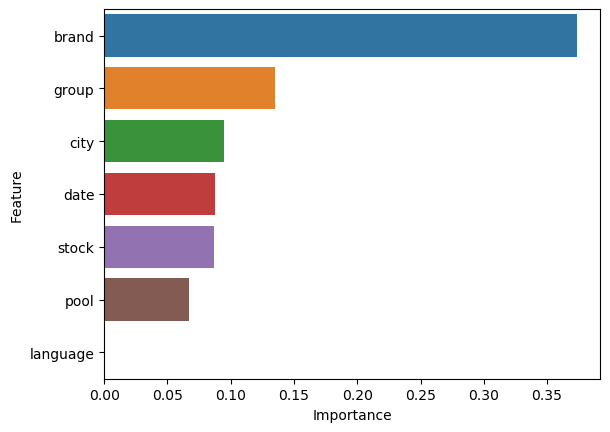

In [45]:
sns.barplot(data = tab, x='Importance', y='Feature')

<font color = 'blue'> La variable brand est à quasi 50 % alors que piscine qui vient juste derriere n'est pas à 20%. Donc ce modèle donne beaucoup d'importance à brand. C'est un point commun avec le random forest target.
  

## PDP plots 

date


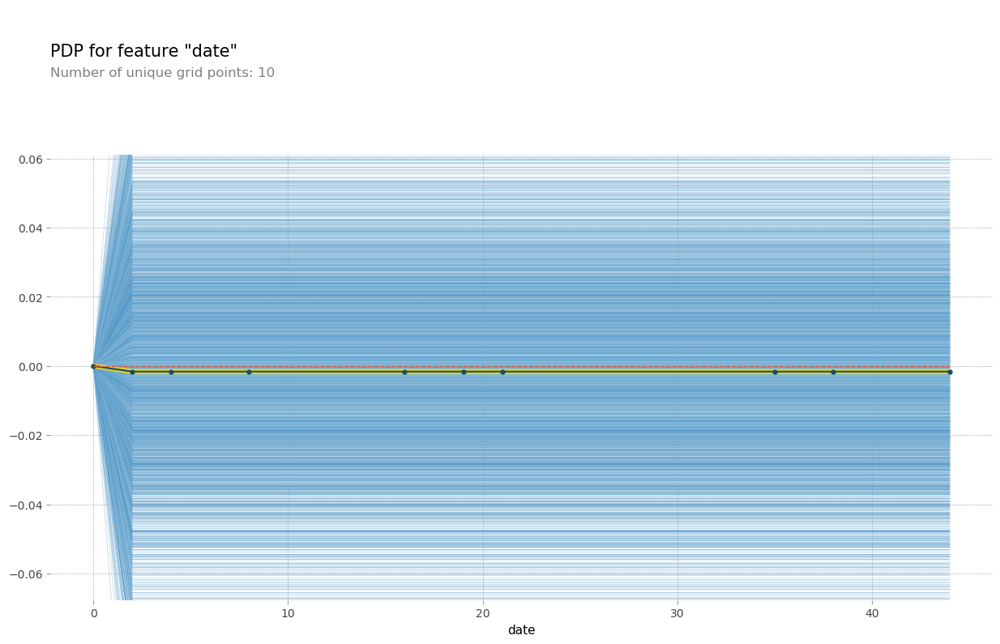

stock


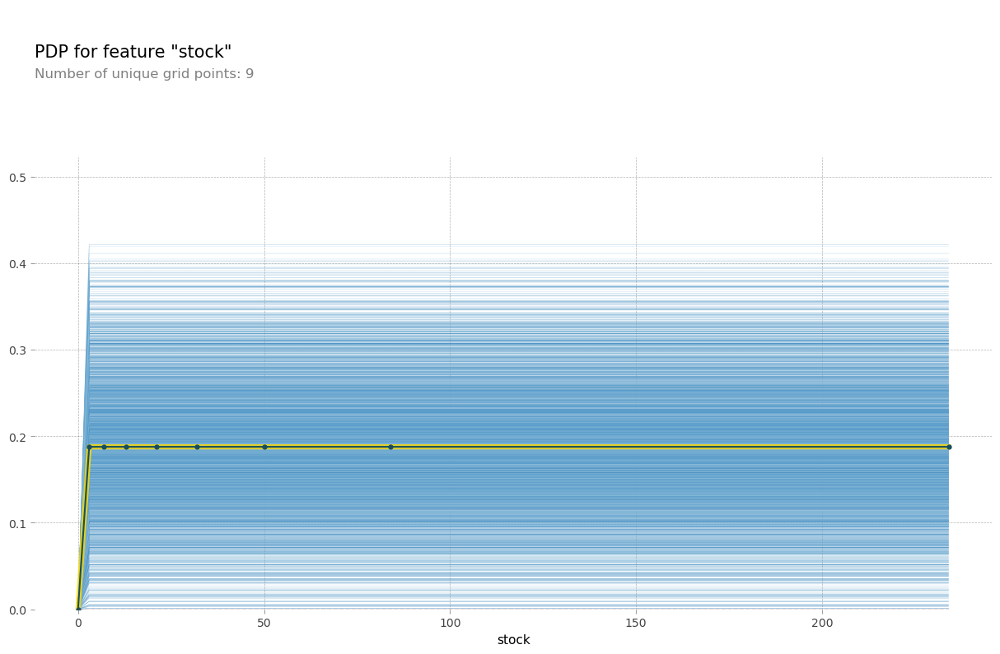

brand_8 Premium


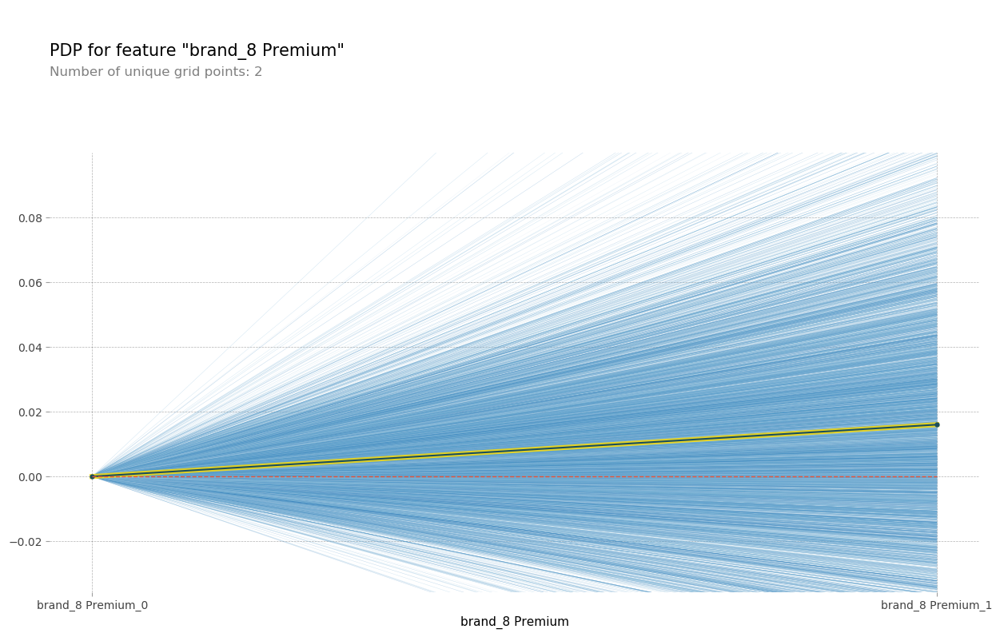

brand_Safitel


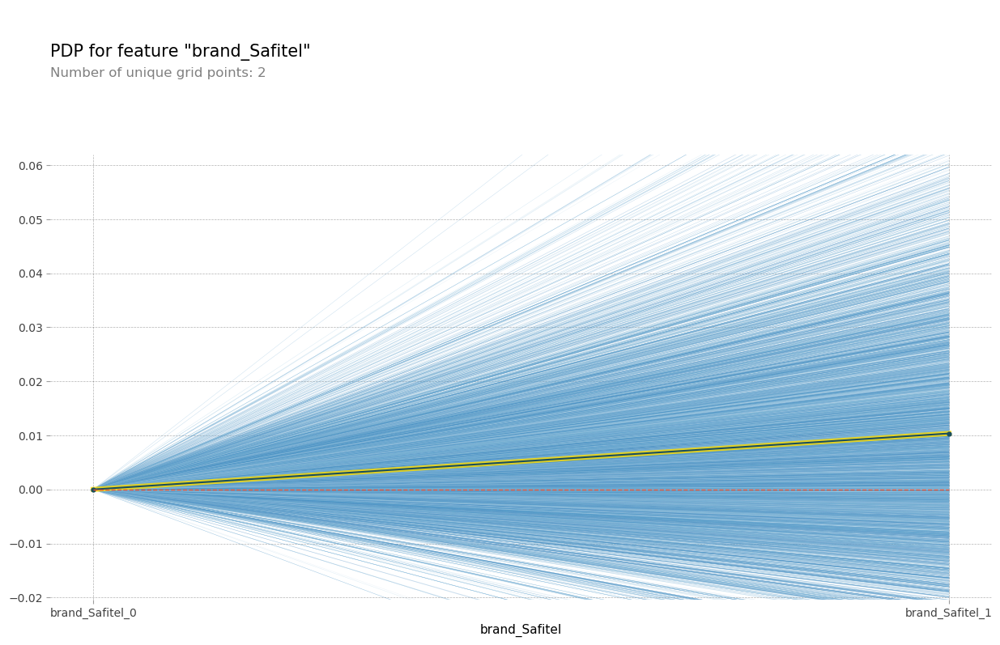

pool


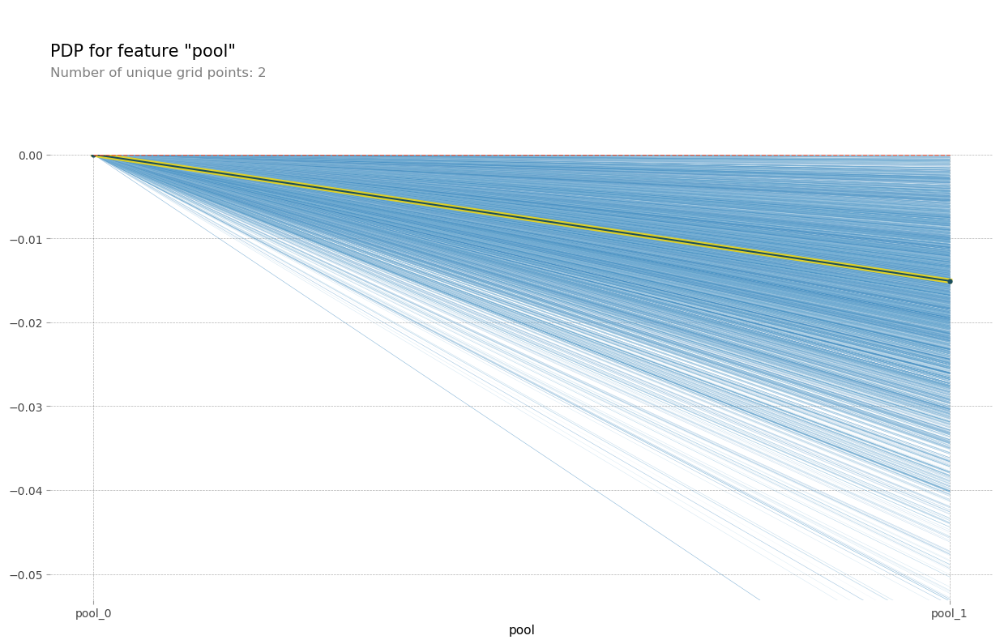

In [46]:
from pdpbox import pdp, get_dataset, info_plots
model = rf
model_name = 'random forest'

features_importance_dict = {}
features_importance_dict[model_name] = feature_importance_df #add the dataframe to your dictionnary

top_5_features = features_importance_dict[model_name].Feature[:5].values

for i, feature in enumerate(top_5_features, 1):
    print(feature)
    pdp_feat = pdp.pdp_isolate(model=model, dataset=X_test, model_features=features_importance_dict[model_name].Feature.values, feature=feature)
    pdp.pdp_plot(pdp_feat, feature, plot_lines=True, frac_to_plot=0.5)
    plt.show()

## Lime

In [47]:
import lime
import lime.lime_tabular

index = 0

explainer = lime.lime_tabular.LimeTabularExplainer(X_test.values, feature_names=features_importance_dict[model_name].Feature, mode="regression")
exp = explainer.explain_instance(X_test.iloc[index], rf.predict, num_features=5, top_labels=1)
exp.show_in_notebook(show_table=True, show_all=True)

<font color = 'blue'>

## Shap

In [48]:
import shap
shap.initjs()
idx = 1 
explainer = shap.KernelExplainer(rf.predict, X_test.iloc[0:20])
shap_values = explainer.shap_values(X_test.iloc[0:20])

  0%|          | 0/20 [00:00<?, ?it/s]

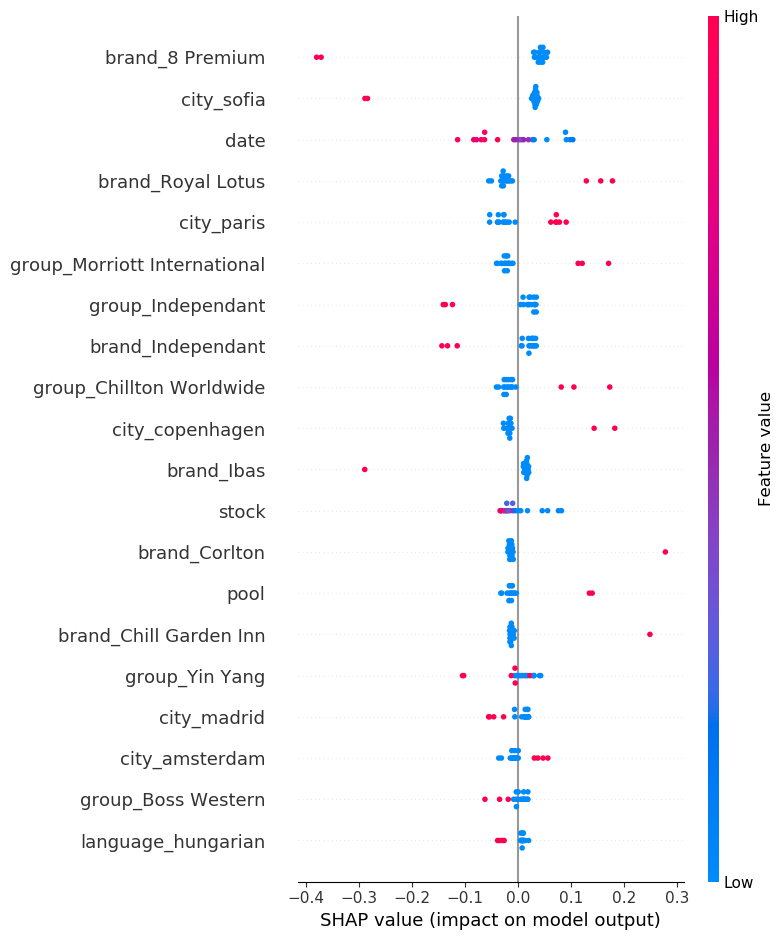

In [49]:
shap.summary_plot(shap_values, X_test.iloc[0:20])

<font color = 'blue'> Ici nous voyons que brand revient dans les variables les plus influentes cependant ce ne sont pas les mêmes que celles dans feature importance. Ceci peut etre du au fait qu'ici on est capable de tester l'impact des variables seulement localement en plus ici avec seulement avec 20 points. Donc seulement les points choisis nous n'aurons pas forcement le meme ordre des variables mais l'impacte reste sensiblement le même.
La brand 8 premium fait baisser le prix alors que la Morriott International (4 étoiles) provoque l'augmentation du prix. Nous avons aussi que plus la date est proche plus ça devient cher et qu'un hotel à sofia est moins cher que paris ce qui est tres réaliste.

## Boosting One hot encoding

In [50]:
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import GradientBoostingClassifier, GradientBoostingRegressor

boosting = GradientBoostingRegressor()
boosting.fit(X_train, price_train)
print(f"Boosting score: {boosting.score(X_test, price_test):.2f}")

Boosting score: 0.93


In [51]:
# Importance décroissante des variables
feature_importance_df = pd.DataFrame({
    'Feature' : X_train.columns,
    'Importance' : boosting.feature_importances_
}).sort_values(by='Importance', ascending=False)
feature_importance_df

,Feature,Importance
1,pool,0.130154
21,brand_8 Premium,0.114010
4,date,0.104602
27,brand_Ibas,0.103264
35,brand_Safitel,0.096203
...,...,...
37,language_austrian,0.000000
5,mobile,0.000000
11,group_Yin Yang,0.000000
29,brand_J.Halliday Inn,0.000000


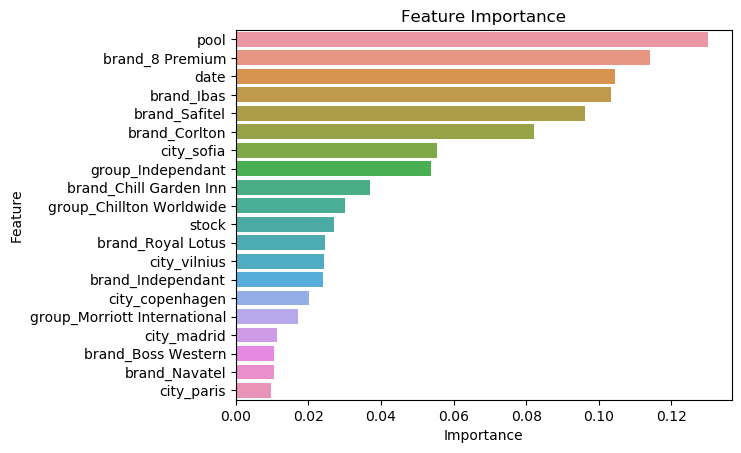

In [52]:
plt.title('Feature Importance')
sns.barplot(data = feature_importance_df.head(20), x='Importance', y='Feature')

<font color = 'blue'> Nous remarquons que contrairement à random forest le boosting semble donner  plus d'importance à la piscine ou encore à date que les brand. Cependant vu que toutes les variables sont encodées nous décidons de regarder leurs importances cumulées.

In [53]:
importance = feature_importance_df.head(20)
importance['is_brand'] = importance.Feature.str.contains('brand')
brand_importance = importance[importance['is_brand'] == True]
sum_brand_importance = brand_importance['Importance'].sum()

importance = feature_importance_df.head(20)
importance['is_city'] = importance.Feature.str.contains('city')
city_importance = importance[importance['is_city'] == True]
sum_city_importance = city_importance['Importance'].sum()

importance = feature_importance_df.head(20)
importance['is_language'] = importance.Feature.str.contains('language')
language_importance = importance[importance['is_language'] == True]
sum_language_importance = language_importance['Importance'].sum()

importance = feature_importance_df.head(20)
importance['is_group'] = importance.Feature.str.contains('group')
group_importance = importance[importance['is_group'] == True]
sum_group_importance = group_importance['Importance'].sum()

importance = feature_importance_df.head(20)
df = pd.DataFrame(columns=['Feature','Importance'])
df.loc[len(importance.axes[0])] = ['brand', sum_brand_importance]
df.loc[len(importance.axes[0])+1] = ['city', sum_city_importance]
df.loc[len(importance.axes[0])+2] = ['language', sum_language_importance]
df.loc[len(importance.axes[0])+4] = ['group', sum_group_importance]

importance1 = importance[importance['Feature'] == 'pool']
importance2 = importance[importance['Feature'] == 'parking']
importance3 = importance[importance['Feature'] == 'children_policy']
importance4 = importance[importance['Feature'] == 'date']
importance5 = importance[importance['Feature'] == 'stock']
importance6 = importance[importance['Feature'] == 'mobile']
tab=pd.concat([importance1,importance2,importance3,importance4,importance5,importance6,df])
tab = tab.sort_values(by = 'Importance', ascending = False)

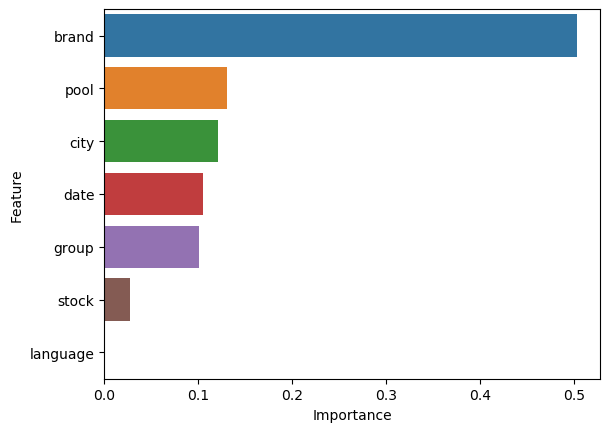

In [54]:
sns.barplot(data = tab, x='Importance', y='Feature')

<font color = 'blue'> Nous remarquons que les importances sont maintenant très semblables à celles avec le random forest.

In [55]:
import shap
shap.initjs()
idx = 1 
explainer = shap.KernelExplainer(boosting.predict, X_test.iloc[0:20])
shap_values = explainer.shap_values(X_test.iloc[0:20])

  0%|          | 0/20 [00:00<?, ?it/s]

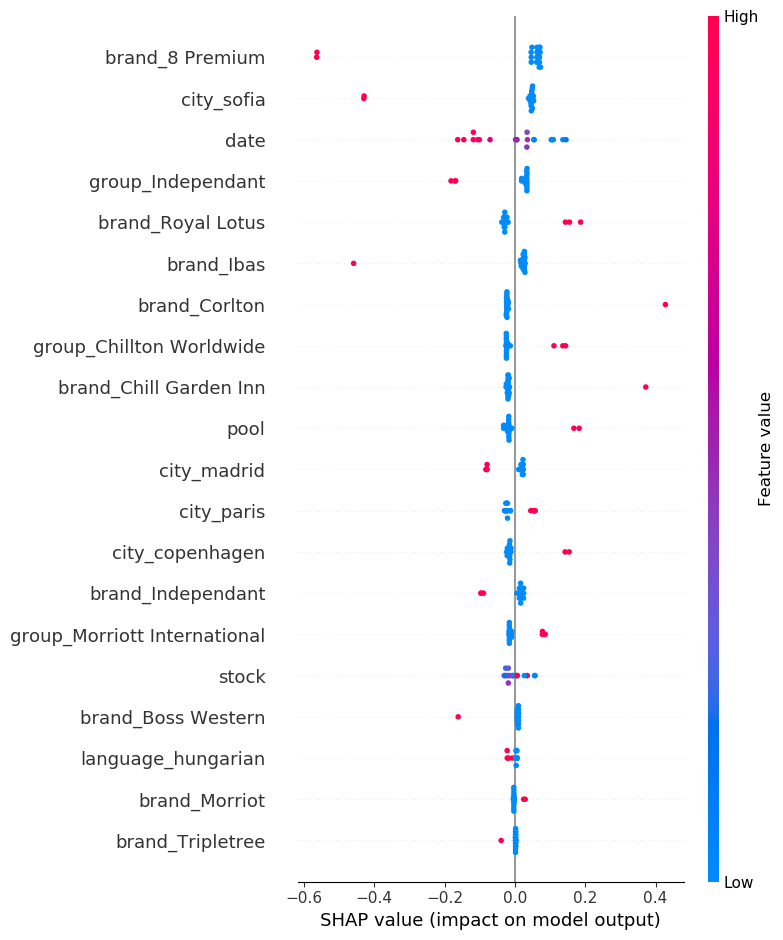

In [56]:
shap.summary_plot(shap_values, X_test.iloc[0:20])

<font color = 'blue'> Nous remarquons aussi que l'impact local des variables est relativement le même que pour random forest.

pool


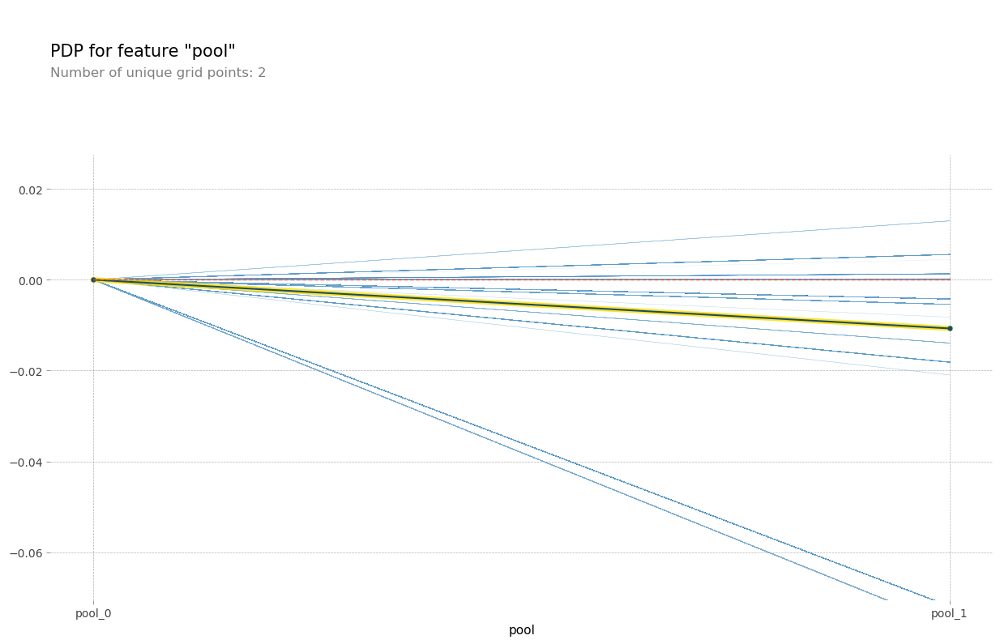

brand_8 Premium


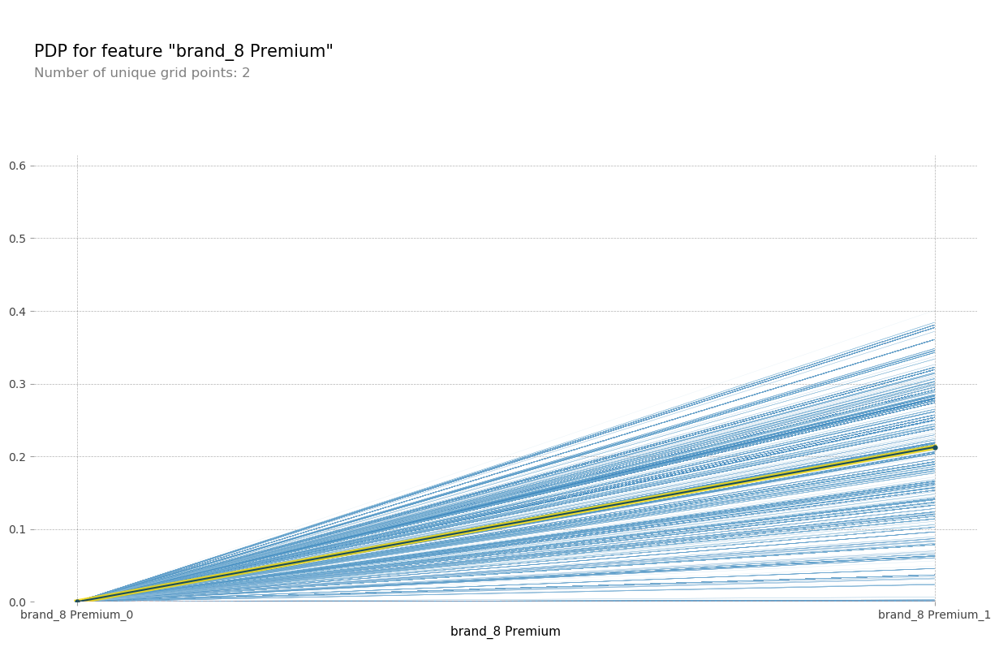

date


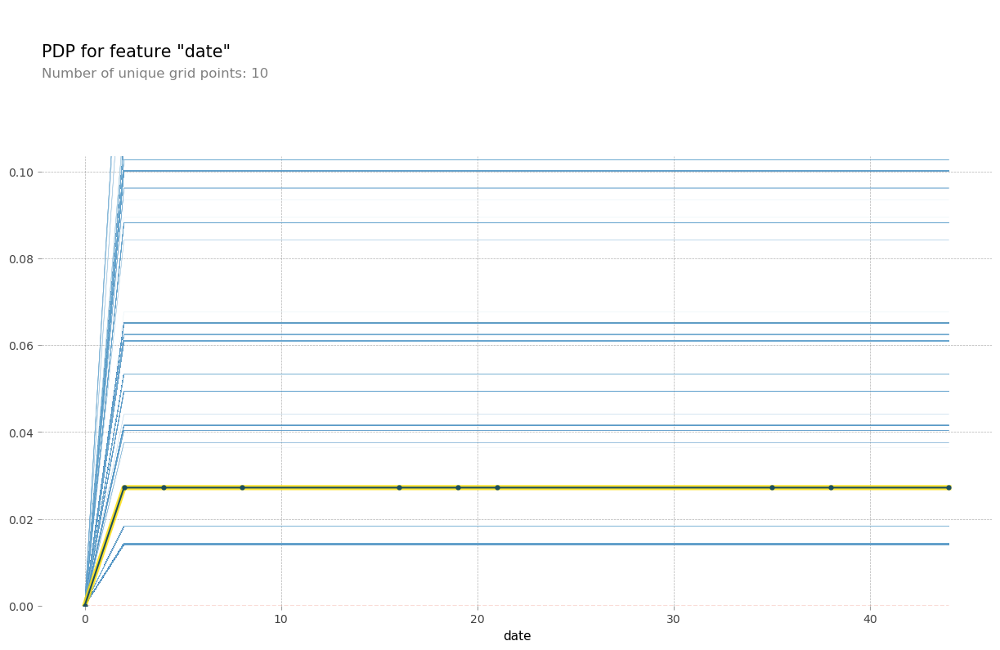

brand_Ibas


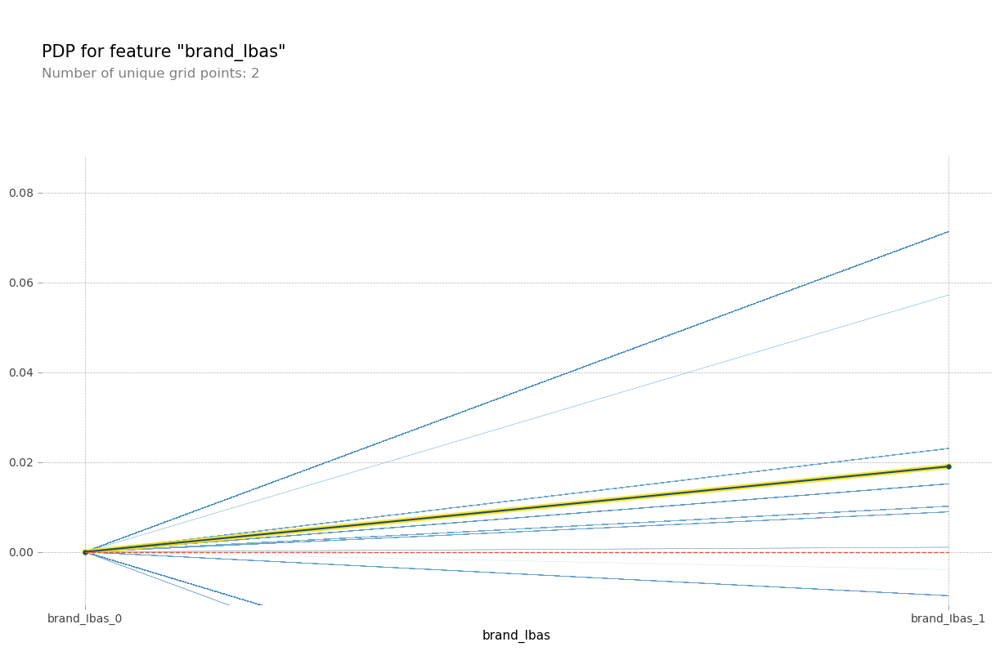

brand_Safitel


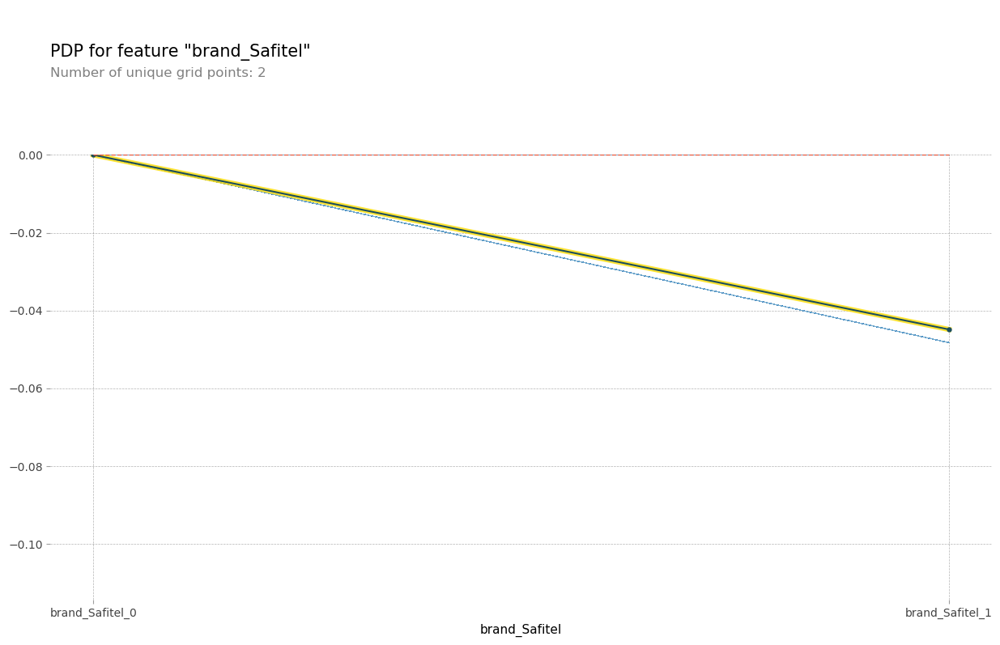

In [57]:
from pdpbox import pdp, get_dataset, info_plots
model = boosting
model_name = 'boosting'

features_importance_dict = {}
features_importance_dict[model_name] = feature_importance_df #add the dataframe to your dictionnary

top_5_features = features_importance_dict[model_name].Feature[:5].values

for i, feature in enumerate(top_5_features, 1):
    print(feature)
    pdp_feat = pdp.pdp_isolate(model=model, dataset=X_test, model_features=features_importance_dict[model_name].Feature.values, feature=feature)
    pdp.pdp_plot(pdp_feat, feature, plot_lines=True, frac_to_plot=0.5)
    plt.show()

## Lime

In [58]:
import lime
import lime.lime_tabular

index = 0

explainer = lime.lime_tabular.LimeTabularExplainer(X_test.values, feature_names=features_importance_dict[model_name].Feature, mode="regression")
exp = explainer.explain_instance(X_test.iloc[index], boosting.predict, num_features=5, top_labels=1)
exp.show_in_notebook(show_table=True, show_all=True)

<font color = 'blue'>  On voit que la valeur prédite est 5.29 et les variables parking, brand mercure et group YinYang font augmenter le prix.